In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
pd.set_option('display.max_columns',None)

In [3]:
df=pd.read_csv('temperature.csv')
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [4]:
df.shape

(7752, 25)

In [5]:
df.isna().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

The following is the list of features which can be dropped:
    1. country,country_long,name,gppd_idnr,latitude,longitude,owner,source,url,geolocation_source,wepp_id,
        generation_data_source - They have nominal values hence, these features won't helpful in predicting the desired label.
    2. other_fuel2,other_fuel3,estimated_generation_gwh - these features have null values.

In [6]:
df.drop(columns=['station', 'Date'],axis=1,inplace=True )

In [7]:
df.dropna(inplace=True)

In [8]:
df.shape

(7590, 23)

In [9]:
df.head()

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


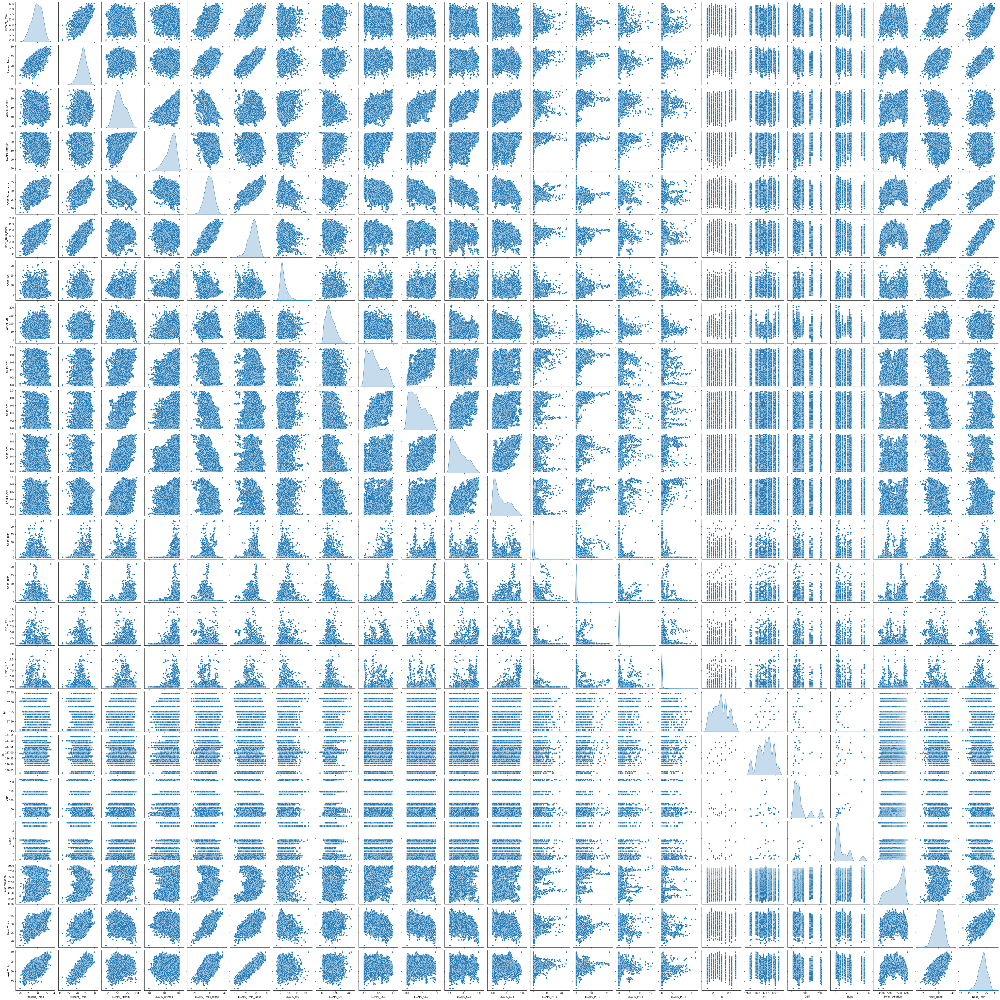

In [45]:
sns.pairplot(df, diag_kind='kde')

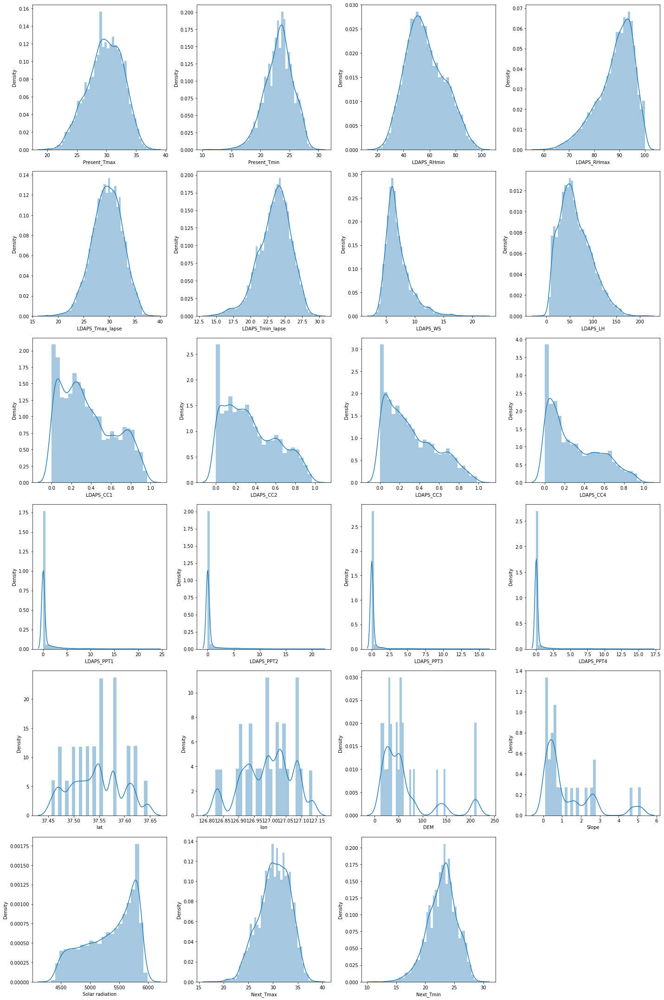

In [46]:
plt.figure(figsize=(20,30))
plotnumber=1

for col in df:
    if plotnumber<=24:
        plt.subplot(6,4,plotnumber)
        sns.distplot(df[col])
        plotnumber+=1
plt.tight_layout()

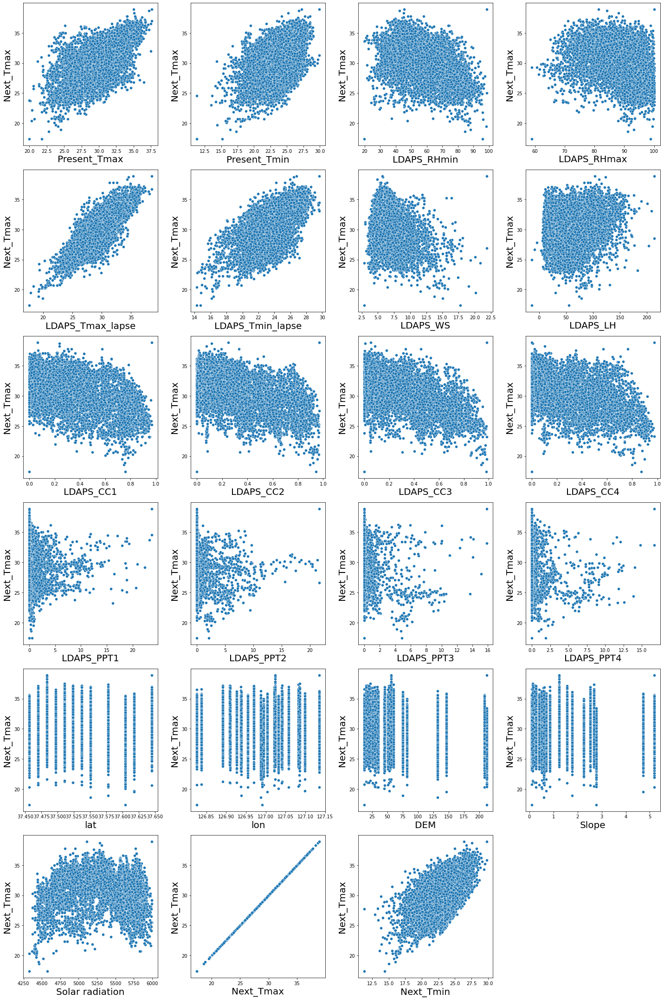

In [47]:
plt.figure(figsize=(20,30))
plotnumber=1

for col in df:
    if plotnumber<=24:
        plt.subplot(6,4,plotnumber)
        sns.scatterplot(x=df[col],y=df['Next_Tmax'])
        plt.xlabel(col,fontsize=20)
        plt.ylabel('Next_Tmax',fontsize=20)
        plotnumber+=1
plt.tight_layout()        

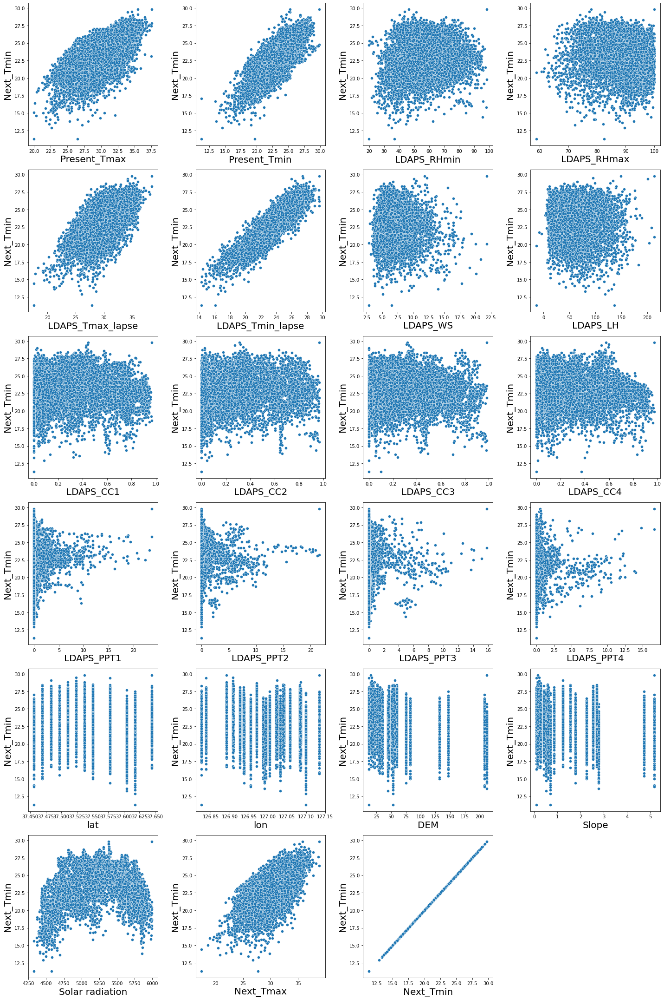

In [48]:
plt.figure(figsize=(20,30))
plotnumber=1

for col in df:
    if plotnumber<=24:
        plt.subplot(6,4,plotnumber)
        sns.scatterplot(x=df[col],y=df['Next_Tmin'])
        plt.xlabel(col,fontsize=20)
        plt.ylabel('Next_Tmin',fontsize=20)
        plotnumber+=1
plt.tight_layout()        

In [10]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

x=df.drop(columns=['Next_Tmax', 'Next_Tmin'])
y=df[['Next_Tmax', 'Next_Tmin']]

In [11]:
scaler=StandardScaler()
x_scaled=scaler.fit_transform(x)

In [12]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge, LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings('ignore')

In [13]:
X_train, X_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.25, random_state=123)

In [14]:
models = [['LinearRegression : ', LinearRegression()],
          ['Lasso : ', Lasso()],
          ['Ridge : ', Ridge()],
          ['KNeighborsRegressor : ', KNeighborsRegressor()],
          ['DecisionTreeRegressor : ', DecisionTreeRegressor()],
          ['RandomForestRegressor : ', RandomForestRegressor()]\
         ]

In [15]:
for name, model in models:
    model=model
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    print(name, (np.sqrt(mean_squared_error(y_test, predictions))))

LinearRegression :  1.3037817303132102
Lasso :  1.7892439012307906
Ridge :  1.303791887809102
KNeighborsRegressor :  1.0236560234634613
DecisionTreeRegressor :  1.4179843662054075
RandomForestRegressor :  0.9216182670945489


In [16]:
algorithms = {
    'DecisionTreeRegressor' : {
        'model' : DecisionTreeRegressor(),
        'param' : {
            'max_depth' : [3, 5, 11,25,50],
            'min_samples_leaf' : [3, 5, 7,15,20,50,100],
            'min_samples_split' : [3, 5, 7,15,20,50,100],
        }
    },
    'RandomForestRegressor' : {
        'model' : RandomForestRegressor(),
        'param' : {
            'n_estimators' : [10,20,50,100, 300],
            'max_depth' : [3, 5, 7, 11,20,50],
            'max_features' : ["auto", "sqrt", "log2"],
            'min_samples_split' : [2, 4, 6,10,15,20]
        }
    },
}

In [17]:
score = []

for name, mp in algorithms.items() :
    rs = RandomizedSearchCV(estimator = mp['model'], param_distributions = mp['param'], cv = 10, n_jobs=-1, verbose=3)
    rs.fit(X_train, y_train)
    score.append({
        'model': name,
        'score' : rs.best_score_,
        'params' : rs.best_params_
    })

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:   20.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   23.6s finished


Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   51.3s finished


In [18]:
performance = pd.DataFrame(score, columns=['model', 'score', 'params'])
performance

,model,score,params
0,DecisionTreeRegressor,0.795635,"{'min_samples_split': 20, 'min_samples_leaf': ..."
1,RandomForestRegressor,0.879546,"{'n_estimators': 300, 'min_samples_split': 15,..."


In [19]:
performance['params'][1]

{'n_estimators': 300,
 'min_samples_split': 15,
 'max_features': 'log2',
 'max_depth': 50}

In [20]:
final_model = RandomForestRegressor(n_estimators=300, min_samples_split=15, max_features='log2', max_depth=50)
final_model.fit(X_train, y_train)
y_pred = final_model.predict(X_test)
print('RMSE of Random Forest Regressor : {}'.format(np.sqrt(mean_squared_error(y_test, y_pred))))

RMSE of Random Forest Regressor : 0.9695664042117944


In [21]:
final_model.score(X_train, y_train), final_model.score(X_test, y_test)

(0.9384664889056475, 0.8859287451014288)

In [22]:
print('MAE:', mean_absolute_error(y_test, y_pred))
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))

MAE: 0.7276900998871623
RMSE: 0.9695664042117944


In [23]:
import pickle
with open ('GlobalPowerPlantPrediction.sav','wb') as f:
    pickle.dump(final_model,f)